## Packages

In [1]:
import numpy as np                                # scientific computing toolkit
import pandas as pd                               # data analysis toolkit
import scanpy as sc                               # scanpy is referred to with sc.***
import matplotlib.pyplot as plt                   # Matplotlib is referred to with plt.***
from scipy import stats                           # for linear regressions
import seaborn as sns                             # for easy heatmaps
import scirpy as ir                               # TCR analysis
import scvelo as scv

sc.settings.verbosity = 3                         # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()                         # check if all needed versions are installed and up to date (old: print_Versions(), changed in new version of scanpy)
results_directory = './Analysis_output/'
results_file = results_directory + '/results_file/write/results.h5ad'             # the file that will store the analysis results

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.23.3 scipy==1.9.1 pandas==1.5.0 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.7


In [2]:
import batchglm.api as glm
import diffxpy.api as de

print("batchglm version "+glm.__version__)
print("diffpy version "+de.__version__)

batchglm version v0.7.4
diffpy version refs/pull/219/head


## Directory variables

In [3]:
import glob
import os
from pathlib import Path

sample_directory = './gex_vdj/'
analysis_info = './analysis_info/'
adata_directory = './Annotated_files/'

In [4]:
plt.rcParams['figure.figsize']=(6,6) #rescale figures
sc.settings.set_figure_params(dpi=100, dpi_save=600, color_map='viridis', vector_friendly=True, format='eps')
### you can set a default figure directory here for saving output
sc.settings.figdir = "./analysis_output/figures_scanpy/"
## Figure directory for matplotlib figures/axes
save_figure_sc = "./analysis_output/figures_scanpy/"
#Use
#plt.savefig(save_figure + 'image.pdf')
save_figure_ir = "./analysis_output/figures_scirpy/"
#csv directory
read_csv = './analysis_output/saved_tables/'
save_csv = r'./analysis_output/saved_tables/'

## Custom functions

In [7]:
def clr_normalize_each_cell(adata, inplace=True):
    """Normalize count vector for each cell, i.e. for each row of .X"""

    import numpy as np
    import scipy

    def seurat_clr(x):
        # TODO: support sparseness
        s = np.sum(np.log1p(x[x > 0]))
        exp = np.exp(s / len(x))
        return np.log1p(x / exp)

    if not inplace:
        adata = adata.copy()

    # apply to dense or sparse matrix, along axis. returns dense matrix
    adata.X = np.apply_along_axis(
        seurat_clr, 1, (adata.X.A if scipy.sparse.issparse(adata.X) else adata.X)
    )
    return adata

## Load data

In [8]:
# define sample metadata. Usually read from a file.
samples = {
    "_1": {"experiment": "1_gp33", "group": "lcmv_exp1"},
    "_8": {"experiment": "2_gp33", "group": "lcmv_exp2"},
}

In [9]:
for sample, sample_meta in samples.items():
    print(sample)

_1
_8


In [10]:
# Create a list of AnnData objects (one for each sample)
adatas = []
for sample, sample_meta in samples.items():
    gex_file = glob.glob(f'{sample_directory}/GEX*{sample}*/outs/filtered_feature_bc_matrix/')[0]
    tcr_file = glob.glob(f'{sample_directory}/VDJ*{sample}*/outs/*annotations.json')[0]
    adata = sc.read_10x_mtx(gex_file,
                            var_names='gene_symbols',      # use gene symbols for the variable names (variables-axis index)
                            cache=True, gex_only=False)   # write a cache file for faster subsequent reading
    adata_tcr = ir.io.read_10x_vdj(tcr_file)
    change_cat = adata_tcr.obs.columns.tolist()           #NaN values in VDJ data can mess up analysis for some reason
    for i in change_cat:                                   #here all NaN (basically for TCR chain calls) are replaced by 'None'
        adata_tcr.obs[i]=adata_tcr.obs[i].astype(str)
        adata_tcr.obs[i]=adata_tcr.obs[i].fillna('None')
        adata_tcr.obs[i]=adata_tcr.obs[i].replace('nan' ,'None')
        adata_tcr.obs[i]=adata_tcr.obs[i].astype('category')
    ir.pp.merge_with_ir(adata, adata_tcr)
    adata.obs["experiment"] = sample_meta["experiment"]
    adata.obs["group"] = sample_meta["group"]
    # concatenation only works with unique gene names
    adata.var_names_make_unique()
    adatas.append(adata)

... reading from cache file cache\gex_vdj-GEX_1-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache\gex_vdj-GEX_8-outs-filtered_feature_bc_matrix-matrix.h5ad


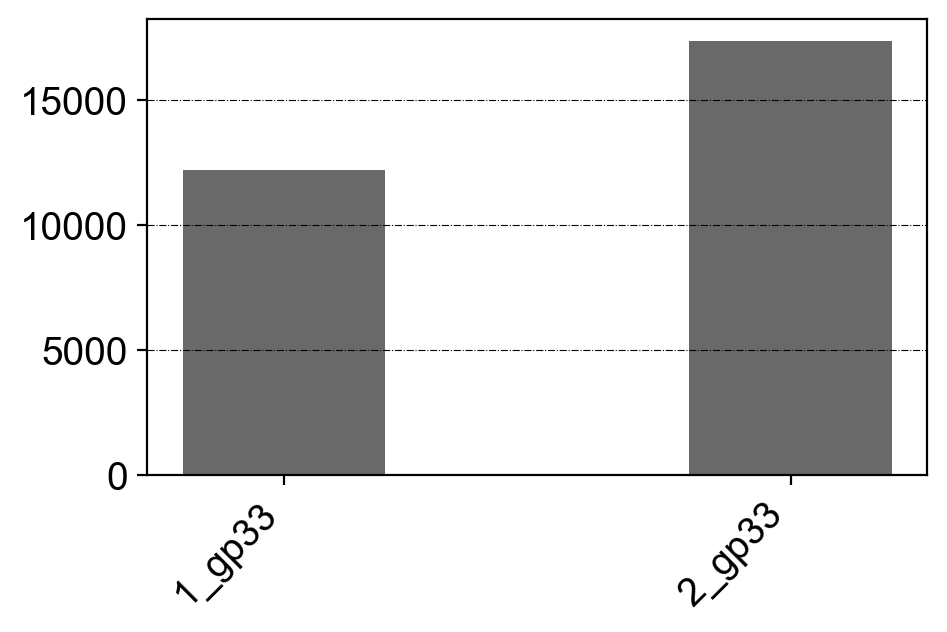

In [11]:
exp_list = []
counts_list = []
for adata in adatas:
    exp = adata.obs.experiment[0]
    counts = adata.n_obs
    exp_list.append(exp)
    counts_list.append(counts)

fig, ax = plt.subplots(figsize = (5, 3))

ax.bar(exp_list, counts_list, color ='dimgray', width = 0.4)
ax.set_xticklabels(exp_list)

ax.grid(False)
ax.grid(color='black', linestyle='-.', linewidth=0.4, axis='y')

for tick in ax.get_xticklabels():
    tick.set_ha('right')
    tick.set_rotation(45)

# Preprocessing

normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)


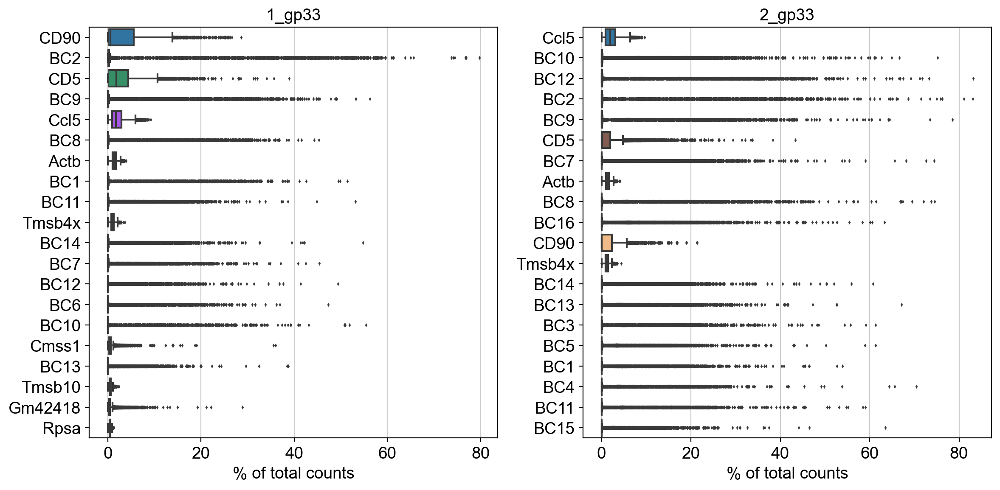

In [12]:
#nrows = len(adatas)//2 + 1
ncols = 2
fig, ax = plt.subplots(ncols=ncols, figsize=(12,3*len(adatas)))
#index = 0
#axis = 0

for i, adata in enumerate(adatas):
        sc.pl.highest_expr_genes(adata, n_top=20, ax=ax[i], show=False)
        ax[i].set_title(adata.obs.experiment[0])

fig.tight_layout()
plt.show() 

fig.savefig(save_figure_sc + 'highest_expr_genes.pdf')

## Hashtag Antibodies

Highest expressed genes in all samples and quality check for hashtag antibody expression - Show those genes that yield the highest fraction of counts in each single cells, across all cells.

In [13]:
single_barcodes = []
for i in range(1,17):
    bc = 'BC'+str(i)
    single_barcodes.append(bc)

group_barcodes_1 = ['CD5', 'CD8b', 'CD90']
group_barcodes_2 = ['CD5', 'CD3', 'CD90']
group_barcodes = [group_barcodes_1,group_barcodes_2]

all_barcodes_1 = single_barcodes + group_barcodes_1
all_barcodes_2 = single_barcodes + group_barcodes_2
adatas_barcodes = [all_barcodes_1,all_barcodes_2]
adatas_all_barcodes = single_barcodes + group_barcodes_1 + group_barcodes_2

print(single_barcodes)
print(group_barcodes_1)
print(group_barcodes_2)

['BC1', 'BC2', 'BC3', 'BC4', 'BC5', 'BC6', 'BC7', 'BC8', 'BC9', 'BC10', 'BC11', 'BC12', 'BC13', 'BC14', 'BC15', 'BC16']
['CD5', 'CD8b', 'CD90']
['CD5', 'CD3', 'CD90']


Barcodes only

normalizing counts per cell
    finished ({time_passed})
normalizing counts per cell
    finished ({time_passed})


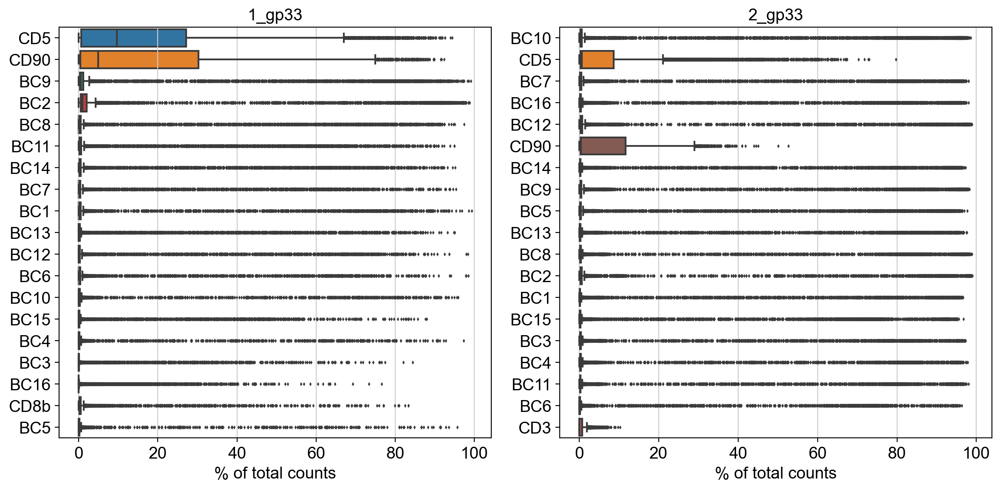

In [14]:
fig, ax = plt.subplots(ncols=2, figsize=(12,3*len(adatas)))

for i, adata in enumerate(adatas):
        sc.pl.highest_expr_genes(adata[:, adata.var_names.isin(adatas_barcodes[i])], n_top=19, ax=ax[i], show=False)
        ax[i].set_title(adata.obs.experiment[0])

fig.tight_layout()
plt.show() 

fig.savefig(save_figure_sc + 'barcodes_only_highest_expr_genes.pdf')

### Basic filter

In the next step we will apply some bacic filters to these cells. Therefore we can control for the minimum number of genes per cell, to take this cell into account. A second filter will filter out genes, which are present in less than a certain number of cells.

In [15]:
for i, adata in enumerate(adatas):
    print(adatas[i].obs.experiment[0] + ' :Total number of cells: {:d}'.format(adatas[i].n_obs))
    sc.pp.filter_cells(adatas[i], min_genes=200)
    sc.pp.filter_genes(adata[i], min_cells=3)
    print(adatas[i].obs.experiment[0] +': Total number of cells after filtering: {:d}'.format(adatas[i].n_obs))

1_gp33 :Total number of cells: 12207
filtered out 3 cells that have less than 200 genes expressed
filtered out 32304 genes that are detected in less than 3 cells
1_gp33: Total number of cells after filtering: 12204
2_gp33 :Total number of cells: 17362
filtered out 5 cells that have less than 200 genes expressed
filtered out 32304 genes that are detected in less than 3 cells
2_gp33: Total number of cells after filtering: 17357


### Store HashTag counts to .obs

In [16]:
import itertools
for i, adata in enumerate(adatas):
    for j, barcode in enumerate(adatas_barcodes[i]):
        barcode_x = adatas[i][:,adata.var_names==barcode].X.todense().tolist()
        barcode_x_list = list(itertools.chain(*barcode_x))
        adatas[i].obs[barcode+'_counts'] = barcode_x_list
    

## HashSolo on grouped barcodes

Generate adata object including only the hashtag antibodies

In [17]:
adatas_HTO_group = [0]*len(adatas)
for i, adata in enumerate(adatas):
    adatas_HTO_group[i]=adata[:, adata.var_names.isin(group_barcodes[i])]

In [18]:
group_bc_HTO_1 = []
for i in group_barcodes_1:
    group_bc_HTO_1.append(i + '_HTO')
    
group_bc_HTO_2 = []
for i in group_barcodes_2:
    group_bc_HTO_2.append(i + '_HTO')
    
group_bc_HTOs = [group_bc_HTO_1,group_bc_HTO_2]

Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2
computing PCA
    with n_comps=2
    finished (0:00:00)
computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:29)
running Leiden clustering
    finished: found 13 clusters and added
    'HTO_leiden', the cluster labels (adata.obs, categorical) (0:00:01)
computing tSNE
    using data matrix X directly
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:39)


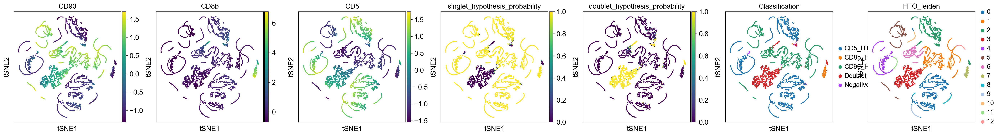

Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2
computing PCA
    with n_comps=2
    finished (0:00:00)
computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
running Leiden clustering
    finished: found 23 clusters and added
    'HTO_leiden', the cluster labels (adata.obs, categorical) (0:00:03)
computing tSNE
    using data matrix X directly
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:01:05)


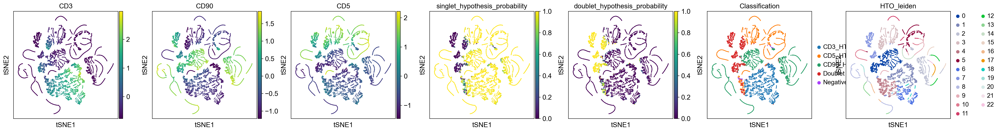

In [19]:
adatas_hashsolo_group = []

for i, adata in enumerate(adatas_HTO_group):
    HTO_data=adata.copy()
    HTO_data.layers["counts"] = HTO_data.X.copy()
    HTO_counts=pd.DataFrame(HTO_data.X.todense(), columns=HTO_data.var_names+'_HTO', index=HTO_data.obs_names)
    HTO_data.obs=pd.concat([HTO_data.obs,HTO_counts], axis=1)
    sc.external.pp.hashsolo(HTO_data,cell_hashing_columns=group_bc_HTOs[i])
    
    adatas_hashsolo_group.append(HTO_data)

    clr_normalize_each_cell(HTO_data)
    sc.pp.log1p(HTO_data)
    sc.pp.scale(HTO_data)
    sc.pp.pca(HTO_data)
    sc.pp.neighbors(HTO_data, n_neighbors=50)
    sc.tl.leiden(HTO_data, key_added="HTO_leiden", resolution=.1)
    #sc.tl.umap(HTO_data)
    sc.tl.tsne(HTO_data)


    #sc.pl.umap(HTO_data, color=HTO_data.var_names.tolist()+['singlet_hypothesis_probability', 'doublet_hypothesis_probability', 'Classification','HTO_leiden'], ncols=10, save='_HTO.pdf')
    sc.pl.tsne(HTO_data, color=HTO_data.var_names.tolist()+['singlet_hypothesis_probability', 'doublet_hypothesis_probability', 'Classification','HTO_leiden'], ncols=10, save=str(adatas_hashsolo_group[i].obs.experiment[0])+'_group_HTO_tsne.pdf')
    #sc.pl.pca(HTO_data, color=HTO_data.var_names.tolist()+['singlet_hypothesis_probability', 'doublet_hypothesis_probability', 'Classification'], ncols=5, save=str(adatas_hashsolo_group[i].obs.experiment[0])+'_group_HTO.pdf')

In [20]:
for i, adata in enumerate(adatas_hashsolo_group):
    adatas[i].obs['group_bc']='None'
    adatas[i].obs.group_bc = adata.obs['Classification']

In [21]:
adatas_filtered = adatas.copy()
for i, adata in enumerate(adatas_filtered):
    adatas_filtered[i] = adata[adata.obs.group_bc.isin(group_bc_HTOs[i])]

In [22]:
for i, adata in enumerate(adatas_filtered):
    print(str(adata.obs.experiment[0]) + ' n_obs before bc:' + str(adatas[i].n_obs) + ' || n_obs after bc:' + str(adata.n_obs))

1_gp33 n_obs before bc:12204 || n_obs after bc:10170
2_gp33 n_obs before bc:17357 || n_obs after bc:14831


After group filter

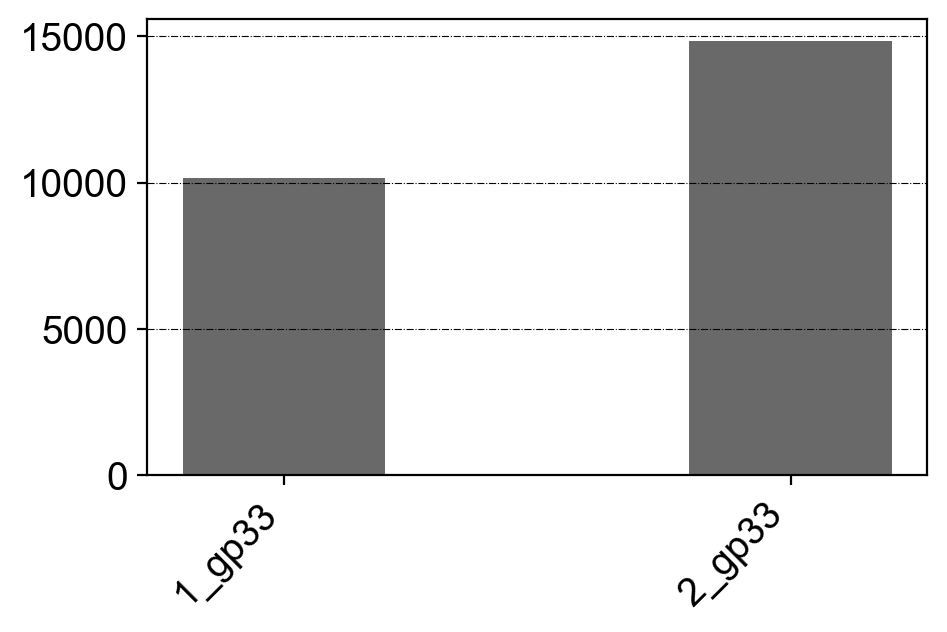

In [23]:
exp_list = []
counts_list = []
for adata in adatas_filtered:
    exp = adata.obs.experiment[0]
    counts = adata.n_obs
    exp_list.append(exp)
    counts_list.append(counts)

fig, ax = plt.subplots(figsize = (5, 3))

ax.bar(exp_list, counts_list, color ='dimgray', width = 0.4)
ax.set_xticklabels(exp_list)

ax.grid(False)
ax.grid(color='black', linestyle='-.', linewidth=0.4, axis='y')

for tick in ax.get_xticklabels():
    tick.set_ha('right')
    tick.set_rotation(45)

## HashSolo on single barcodes

In [24]:
single_bc_HTO = []
for i in single_barcodes:
    single_bc_HTO.append(i + '_HTO')

In [25]:
adatas_HTO_single = [0]*len(adatas_filtered)
for i, adata in enumerate(adatas_filtered):
    adatas_HTO_single[i]=adata[:, adata.var_names.isin(single_barcodes)]

Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2
computing PCA
    with n_comps=15
    finished (0:00:00)
computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
running Leiden clustering
    finished: found 16 clusters and added
    'HTO_leiden', the cluster labels (adata.obs, categorical) (0:00:01)
computing tSNE
    using data matrix X directly
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:36)


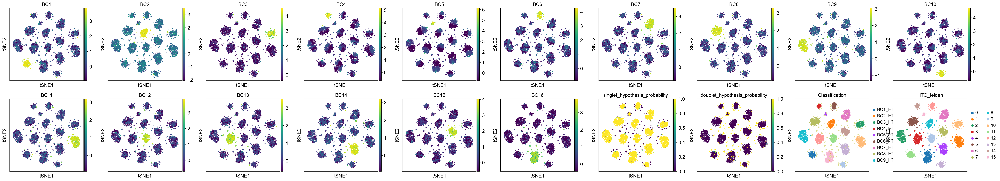

Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2
computing PCA
    with n_comps=15
    finished (0:00:00)
computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
running Leiden clustering
    finished: found 16 clusters and added
    'HTO_leiden', the cluster labels (adata.obs, categorical) (0:00:03)
computing tSNE
    using data matrix X directly
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:57)


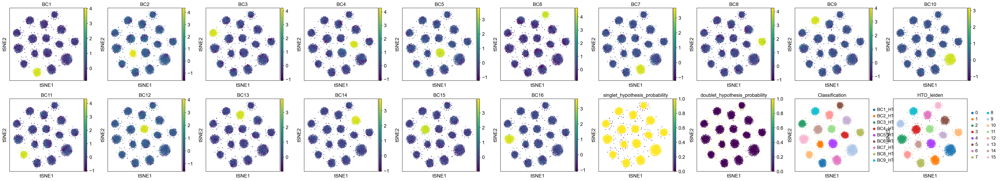

In [26]:
adatas_hashsolo_single = []

for i, adata in enumerate(adatas_HTO_single):
    HTO_data=adata.copy()
    HTO_data.layers["counts"] = HTO_data.X.copy()
    HTO_counts=pd.DataFrame(HTO_data.X.todense(), columns=HTO_data.var_names+'_HTO', index=HTO_data.obs_names)
    HTO_data.obs=pd.concat([HTO_data.obs,HTO_counts], axis=1)
    sc.external.pp.hashsolo(HTO_data,cell_hashing_columns=single_bc_HTO)
    
    adatas_hashsolo_single.append(HTO_data)

    clr_normalize_each_cell(HTO_data)
    sc.pp.log1p(HTO_data)
    sc.pp.scale(HTO_data)
    sc.pp.pca(HTO_data)
    sc.pp.neighbors(HTO_data, n_neighbors=50)
    sc.tl.leiden(HTO_data, key_added="HTO_leiden", resolution=.1)
    #sc.tl.umap(HTO_data)
    sc.tl.tsne(HTO_data)


    #sc.pl.umap(HTO_data, color=HTO_data.var_names.tolist()+['singlet_hypothesis_probability', 'doublet_hypothesis_probability', 'Classification','HTO_leiden'], ncols=10, save='_HTO.pdf')
    sc.pl.tsne(HTO_data, color=HTO_data.var_names.tolist()+['singlet_hypothesis_probability', 'doublet_hypothesis_probability', 'Classification','HTO_leiden'], ncols=10, save=str(adatas_hashsolo_single[i].obs.experiment[0])+'_single_HTO_tsne.pdf')
    #sc.pl.pca(HTO_data, color=HTO_data.var_names.tolist()+['singlet_hypothesis_probability', 'doublet_hypothesis_probability', 'Classification'], ncols=5, save=str(adatas_hashsolo_group[i].obs.experiment[0])+'_single_HTO_PCA.pdf')

In [27]:
for i, adata in enumerate(adatas_hashsolo_single):
    adatas_filtered[i].obs['single_bc']='None'
    adatas_filtered[i].obs.single_bc = adata.obs['Classification']

In [28]:
adatas_filtered_single = adatas_filtered.copy()
for i, adata in enumerate(adatas_filtered_single):
    adatas_filtered_single[i] = adata[adata.obs.single_bc.isin(single_bc_HTO)]

In [29]:
for i, adata in enumerate(adatas_filtered_single):
    print(str(adata.obs.experiment[0]) + ' n_obs before bc:' + str(adatas_filtered[i].n_obs) + ' || n_obs after bc:' + str(adata.n_obs))

1_gp33 n_obs before bc:10170 || n_obs after bc:8858
2_gp33 n_obs before bc:14831 || n_obs after bc:13671


After single filter

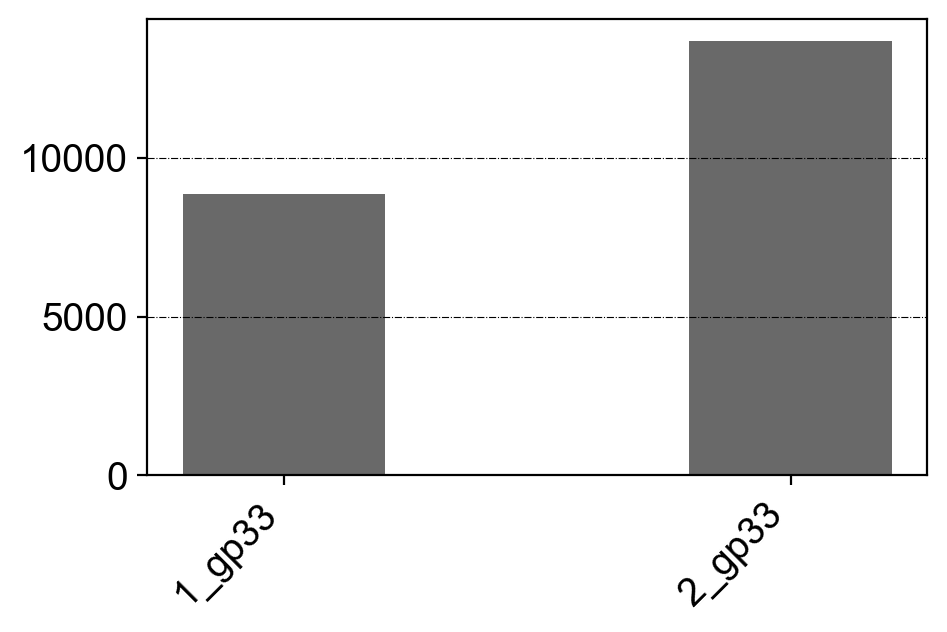

In [30]:
exp_list = []
counts_list = []
for adata in adatas_filtered_single:
    exp = adata.obs.experiment[0]
    counts = adata.n_obs
    exp_list.append(exp)
    counts_list.append(counts)

fig, ax = plt.subplots(figsize = (5, 3))

ax.bar(exp_list, counts_list, color ='dimgray', width = 0.4)
ax.set_xticklabels(exp_list)
ax.grid(False)
ax.grid(color='black', linestyle='-.', linewidth=0.4, axis='y')

for tick in ax.get_xticklabels():
    tick.set_ha('right')
    tick.set_rotation(45)

In [31]:
exp_list = []
counts_adata = []
counts_adata_f = []
counts_adata_fs = []

for adata, adata_f, adata_fs in zip(adatas,adatas_filtered,adatas_filtered_single):
    exp = adata.obs.experiment[0]
    a = adata.n_obs
    f = adata_f.n_obs
    fs = adata_fs.n_obs
    exp_list.append(exp)
    counts_adata.append(a)
    counts_adata_f.append(f)
    counts_adata_fs.append(fs)
    
data = {'exp':exp_list,'adata':counts_adata,'adata_first_barcodes':counts_adata_f,'adata_second_barcodes':counts_adata_fs}
df = pd.DataFrame(data)
df = df.set_index('exp')


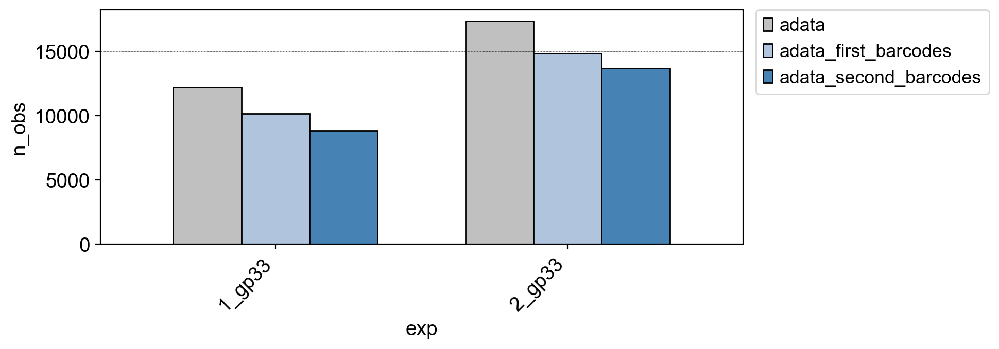

In [32]:
color_dict = {'adata':'silver', 'adata_first_barcodes':'lightsteelblue', 'adata_second_barcodes':'steelblue'}

fig, ax = plt.subplots(figsize = (8, 3))

df.plot(kind='bar', width=0.7, edgecolor='black', ax=ax, color=[color_dict.get(x) for x in df.columns])

ax.grid(False)
ax.grid(color='black', linestyle='-.', linewidth=0.2, axis='y')
ax.set_ylabel('n_obs')
ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

for tick in ax.get_xticklabels():
    tick.set_ha('right')
    tick.set_rotation(45)

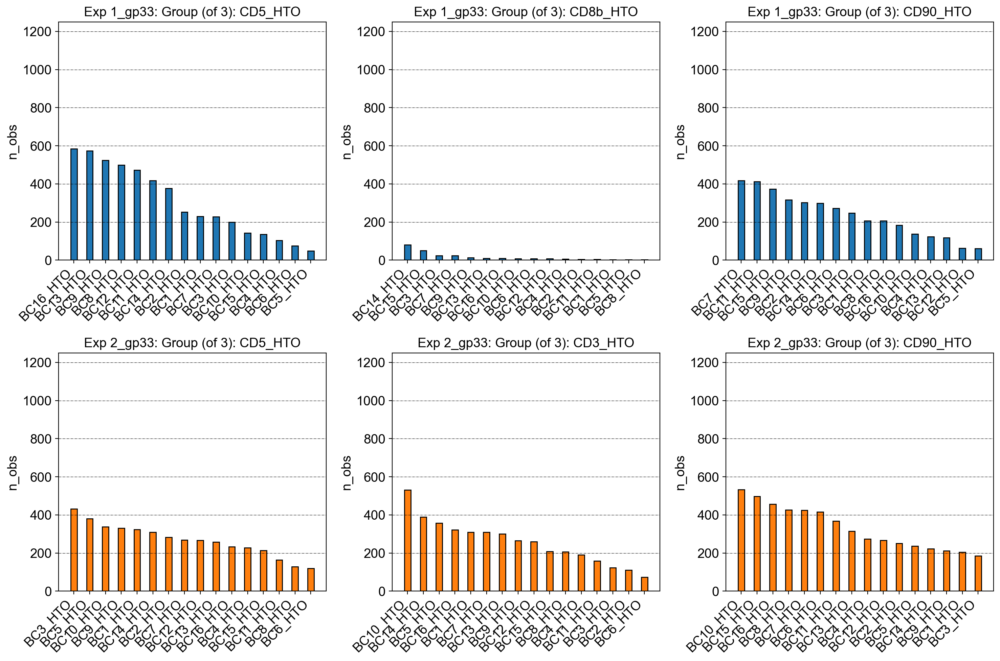

In [33]:
fig, ax = plt.subplots(nrows=len(adatas_filtered_single), ncols=len(group_bc_HTOs[0]), figsize = (15, 10))
j = 0
palette_tab10 = sns.color_palette("tab10", 10)

for i, adata in enumerate(adatas_filtered_single):
    for group in group_bc_HTOs[i]:
        xticks = adata.obs[adata.obs.group_bc==group].single_bc.value_counts().index.tolist()
        counts = adata.obs[adata.obs.group_bc==group].single_bc.value_counts().tolist()
        
        ax[i,j].bar(xticks, counts, color = palette_tab10[i], width = 0.4, edgecolor='black',)
        ax[i,j].set_xticklabels(xticks)
        ax[i,j].set_ylabel('n_obs')
        ax[i,j].set_title('Exp ' + str(adata.obs.experiment[0]+': ' + 'Group (of 3): ' + str(group)))
        
        ax[i,j].grid(False)
        ax[i,j].grid(color='black', linestyle='-.', linewidth=0.4, axis='y')
        ax[i,j].set_ylim(0,1250)
        for tick in ax[i,j].get_xticklabels():
            tick.set_ha('right')
            tick.set_rotation(45)
            
        j=j+1
        if j == 3:
            j=0
        
fig.tight_layout()
fig.savefig(save_figure_sc + 'cell_counts_by_experiment_and_group.pdf')
    

### Remove hashtag expression

In [34]:
for i, adata in enumerate(adatas_filtered):
    adatas_filtered[i]=adatas_filtered[i][:, ~adatas_filtered[i].var_names.isin(adatas_all_barcodes)].copy()

## Annotation of mouse samples

In [35]:
experiment_list = ['1_gp33','2_gp33']

Annotation of experimental conditions

In [36]:
adatas_filtered[0].obs['multimer']='multimer_pos'
adatas_filtered[1].obs['multimer']='multimer_pos'

adatas_filtered[0].obs['batch']='unstim'
adatas_filtered[1].obs['batch']='unstim'



Read-in barcode annotation

In [37]:
hto_annotation = pd.read_csv('./analysis_info/annotation_gp33.csv')

In [38]:
hto_annotation['single_bc']= hto_annotation['single_bc'].map(str)
hto_annotation['group_bc']= hto_annotation['group_bc'].map(str)
hto_annotation['experiment']= hto_annotation['experiment'].map(str)
hto_annotation['mouse']= hto_annotation['mouse'].map(str)

In [39]:
bc_m_HTO = []
for barcode in single_barcodes:
    bc_m_HTO.append(barcode + "_HTO")

In [40]:
for i, adata in enumerate(adatas_filtered):
    #create mouse column in obs
    adatas_filtered[i].obs['mouse']='None'
    #define experiment
    experiment = adata.obs.experiment[0]
    
    #look for group barcode
    group = 'CD5'
    for barcode in (bc_m_HTO):
        #get all cell ids that have group barcode and respective single barcode
        anot = adata.obs_names.values[np.logical_and(adata.obs.group_bc=='CD5_HTO',adata.obs.single_bc==barcode)]
        #look for mouse annotation in csv file that matches the defined barcodes and experiment
        mouse = hto_annotation.loc[((hto_annotation.single_bc==barcode) & (hto_annotation.experiment==experiment) & (hto_annotation.group_bc==group)),'mouse'].item()
        #writes mouse annotation into adata.obs.mouse
        adata.obs.loc[anot, 'mouse'] = mouse
        
    #the same for group barcode CD90
    experiment = adata.obs.experiment[0]
    group = 'CD90'
    for barcode in (bc_m_HTO):
        anot = adata.obs_names.values[np.logical_and(adata.obs.group_bc=='CD90_HTO',adata.obs.single_bc==barcode)]
        mouse = hto_annotation.loc[((hto_annotation.single_bc==barcode) & (hto_annotation.experiment==experiment) & (hto_annotation.group_bc==group)),'mouse'].item()
        adata.obs.loc[anot, 'mouse'] = mouse
        
    if experiment == '1_gp33':
         #the same for group barcode CD8b
        experiment = adata.obs.experiment[0]
        group = 'CD8b'
        for barcode in (bc_m_HTO):
            anot = adata.obs_names.values[np.logical_and(adata.obs.group_bc=='CD8b_HTO',adata.obs.single_bc==barcode)]
            mouse = hto_annotation.loc[((hto_annotation.single_bc==barcode) & (hto_annotation.experiment==experiment) & (hto_annotation.group_bc==group)),'mouse'].item()
            adata.obs.loc[anot, 'mouse'] = mouse
        
    else:
        group = 'CD3'
        for barcode in (bc_m_HTO):
            anot = adata.obs_names.values[np.logical_and(adata.obs.group_bc=='CD3_HTO',adata.obs.single_bc==barcode)]
            mouse = hto_annotation.loc[((hto_annotation.single_bc==barcode) & (hto_annotation.experiment==experiment) & (hto_annotation.group_bc==group)),'mouse'].item()
            adata.obs.loc[anot, 'mouse'] = mouse

In [41]:
adatas_filtered[0].obs.mouse.value_counts()

None    1312
m48      585
m45      574
m41      524
m40      499
m44      473
m43      417
m7       417
m11      413
m46      377
m15      374
m9       317
m2       302
m14      299
m6       272
m34      252
m3       247
m33      230
m39      227
m1       207
m8       206
m35      199
m16      184
m42      142
m10      137
m47      136
m4       124
m13      117
m36      103
m30       81
m38       76
m12       63
m5        61
m31       51
m37       48
m19       24
m23       23
m25       14
m29        9
m32        9
m26        8
m28        7
m22        7
m20        6
m27        5
m18        5
m17        3
m21        2
m24        2
Name: mouse, dtype: int64

Exclude CD8b group as HashTag interfered with Multimer staining

In [42]:
print(adatas_filtered[0].n_obs)
adatas_filtered[0] = adatas_filtered[0][~adatas_filtered[0].obs.group_bc.isin(['CD8b_HTO'])]
print(adatas_filtered[0].n_obs)

10170
9904


Excludes all cells without a hashtag

In [43]:
for i, adata in enumerate(adatas_filtered):
    print("before: " + str(adatas_filtered[i].n_obs))
    adatas_filtered[i] = adata[adata.obs.mouse!='None'].copy()
    print("after: " + str(adatas_filtered[i].n_obs))

before: 9904
after: 8602
before: 14831
after: 13671


# Quality control

### Calculation of QC metrix

Compute number of deteced genes per cell, total counts per cell and percentage of mitochondrial genes per cell.

In [44]:
for i, adata in enumerate(adatas_filtered):
    # mitochondrial genes
    adatas_filtered[i].var["mt"] = adata.var_names.str.startswith("mt-")
    # ribosomal genes
    adatas_filtered[i].var["ribo"] = adata.var_names.str.startswith(("Rps", "Rpl"))
    # hemoglobin genes.
    adatas_filtered[i].var["hb"] = adata.var_names.str.contains(("^hb[^(p)]"))

In [45]:
for i, adata in enumerate(adatas_filtered):
    sc.pp.calculate_qc_metrics(
        adata, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True
    )

In [46]:
#tcr_list = adata.var_names[(adata.var_names.str.startswith('TRBV')) | (adata.var_names.str.startswith('TRBJ')) |
#                    (adata.var_names.str.startswith('TRBD')) | (adata.var_names.str.startswith('TRAV')) |
#                    (adata.var_names.str.startswith('TRAJ'))].tolist()

In [47]:
adatas_filtered[0].var_names[adatas_filtered[0].var_names.str.startswith("Mt")]

Index(['Mterf4', 'Mtx2', 'Mtch2', 'Mtln', 'Mtg2', 'Mtfr1', 'Mtx1', 'Mtmr11',
       'Mttp', 'Mtap', 'Mtf1', 'Mtfr1l', 'Mthfr', 'Mtor', 'Mterf1a', 'Mterf1b',
       'Mthfd2l', 'Mtf2', 'Mtif3', 'Mtus2', 'Mtpn', 'Mturn', 'Mthfd2',
       'Mtmr14', 'Mtag2', 'Mtmr10', 'Mtg1', 'Mtmr7', 'Mtus1', 'Mtnr1a', 'Mt4',
       'Mt3', 'Mt2', 'Mt1', 'Mtss2', 'Mthfsd', 'Mtmr2', 'Mtnr1b', 'Mtfmt',
       'Mto1', 'Mthfsl', 'Mthfs', 'Mthfd1l', 'Mtrf1l', 'Mtfr2', 'Mterf2',
       'Mtfp1', 'Mtmr3', 'Mtif2', 'Mtmr4', 'Mthfd1', 'Mta1', 'Mtr', 'Mterf3',
       'Mtrr', 'Mtx3', 'Mtrex', 'Mtmr6', 'Mtmr9', 'Mtrf1', 'Mtmr12', 'Mtdh',
       'Mtbp', 'Mtss1', 'Mtch1', 'Mtcl1', 'Mta3', 'Mtpap', 'Mta2', 'Mtm1',
       'Mtmr1', 'Mtcp1'],
      dtype='object')

Plot quality control metrics

1_gp33 :


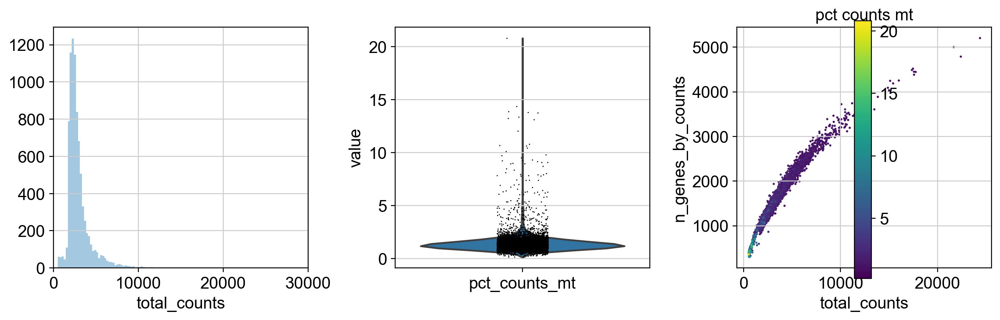

2_gp33 :


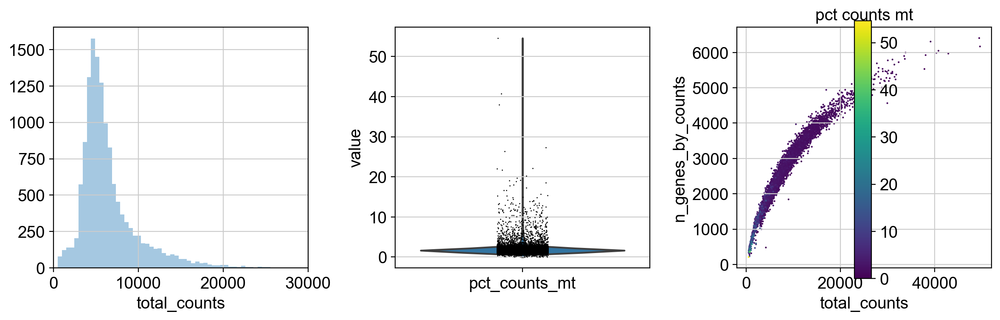

In [48]:
#fig, ax = plt.subplots(ncols=3, nrows=len(adatas))

for i, adata in enumerate(adatas_filtered):
    fig, ax = plt.subplots(ncols=3, figsize=(12,4))
    print(adata.obs.experiment[0], ":")
    sns.distplot(adata.obs["total_counts"], bins=100, kde=False, ax=ax[0])
    ax[0].set_xlim(0,30000)
    sc.pl.violin(adata, "pct_counts_mt", ax=ax[1], show=False)
    sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts", color="pct_counts_mt", ax=ax[2], show=False)
    fig.tight_layout() 
    plt.show()

                               

In [49]:
from scipy.stats import median_abs_deviation

def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier

In [50]:
for adata in adatas_filtered:
    adata.obs["outlier"] = (
        is_outlier(adata, "log1p_total_counts", 5)
        | is_outlier(adata, "log1p_n_genes_by_counts", 5)
        | is_outlier(adata, "pct_counts_in_top_20_genes", 5)
    )
    print(adata.obs.outlier.value_counts())

False    8219
True      383
Name: outlier, dtype: int64
False    13144
True       527
Name: outlier, dtype: int64


In [51]:
for adata in adatas_filtered:
    adata.obs["mt_outlier"] = is_outlier(adata, "pct_counts_mt", 5) | (adata.obs["pct_counts_mt"] > 15)
    print(adata.obs.mt_outlier.value_counts())

False    8343
True      259
Name: mt_outlier, dtype: int64
False    13016
True       655
Name: mt_outlier, dtype: int64


Do filtering:

In [52]:
for i, adata in enumerate(adatas_filtered):
    print(f"Total number of cells: {adata.n_obs}")
    adatas_filtered[i] = adata[(~adata.obs.outlier) & (~adata.obs.mt_outlier)].copy()
    print(f"Number of cells after filtering of low quality cells: {adatas_filtered[i].n_obs}")

Total number of cells: 8602
Number of cells after filtering of low quality cells: 8080
Total number of cells: 13671
Number of cells after filtering of low quality cells: 12750


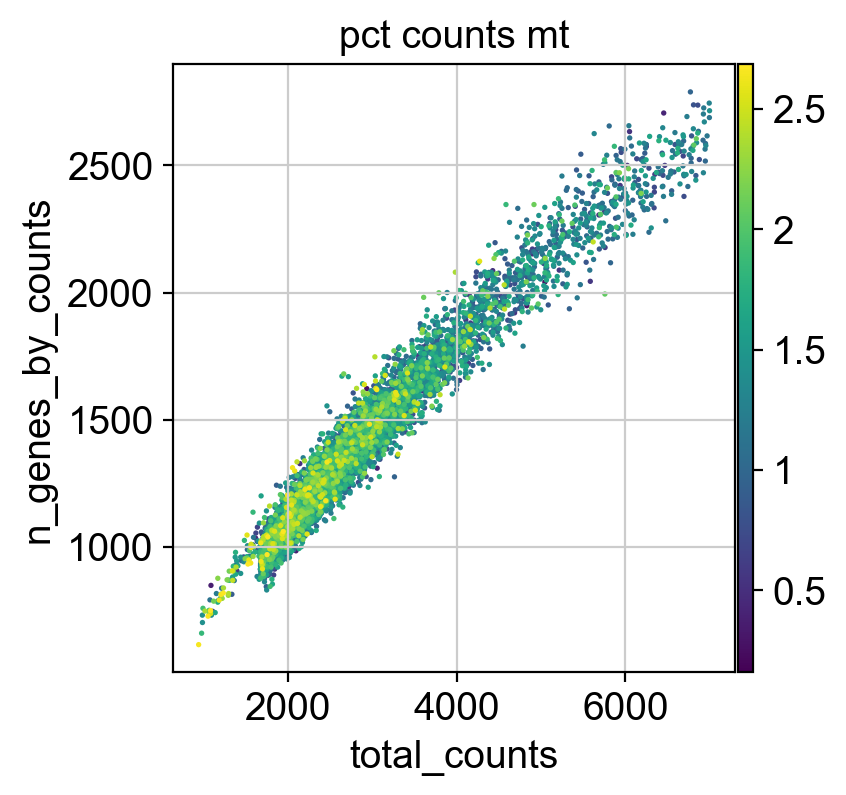

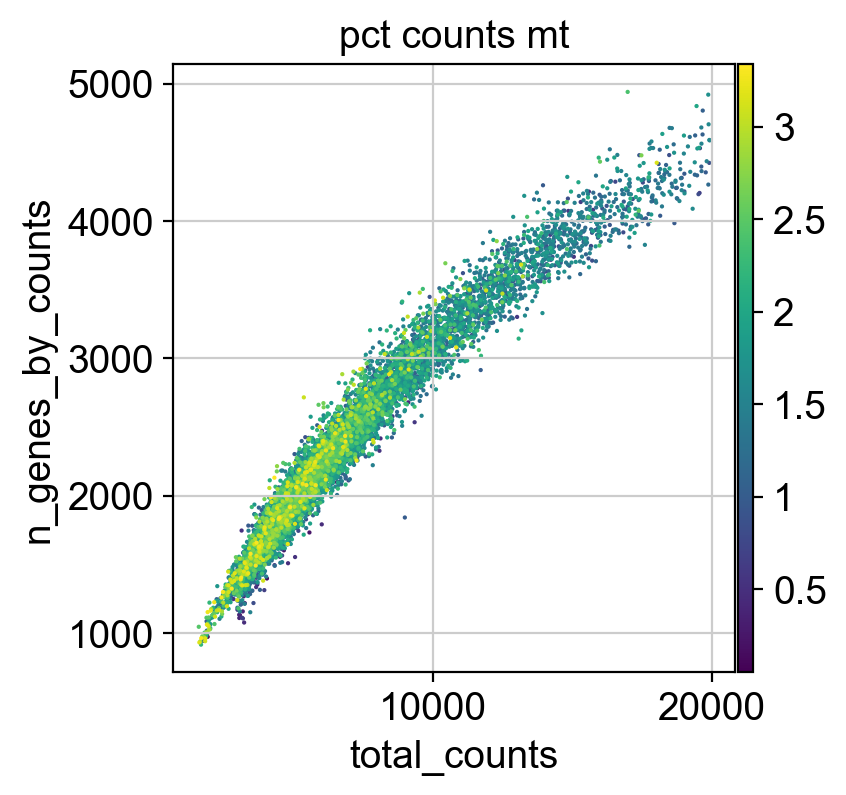

In [53]:
for adata in adatas_filtered:
    sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

SoupX package broken?

### Correction for ambient mRNA

In [54]:
import os
os.environ['R_HOME'] = 'C:/Program Files/R/R-4.3.1'

import anndata2ri
import logging

import rpy2.rinterface_lib.callbacks as rcb
import rpy2.robjects as ro


rcb.logger.setLevel(logging.ERROR)
ro.pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [55]:
#%%R
#install.packages("SoupX")

In [56]:
%%R
library(SoupX)


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)
In addition: Warning message:
package 'SoupX' was built under R version 4.3.2 


In [57]:
adatas_pp = []
for adata in adatas_filtered:
    adata_pp = adata.copy()
    sc.pp.normalize_per_cell(adata_pp)
    sc.pp.log1p(adata_pp)
    adatas_pp.append(adata_pp)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [58]:
soupx_vectors = []
for adata_pp in adatas_pp:
    sc.pp.pca(adata_pp)
    sc.pp.neighbors(adata_pp)
    sc.tl.leiden(adata_pp, key_added="soupx_groups")

    # Preprocess variables for SoupX
    soupx_groups = adata_pp.obs["soupx_groups"]
    soupx_vectors.append(soupx_groups)

computing PCA
    with n_comps=50
    finished (0:00:18)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
running Leiden clustering
    finished: found 8 clusters and added
    'soupx_groups', the cluster labels (adata.obs, categorical) (0:00:02)
computing PCA
    with n_comps=50
    finished (0:00:37)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 12 clusters and added
    'soupx_groups', the cluster labels (adata.obs, categorical) (0:00:01)


In [59]:
del adatas_pp

In [60]:
cell_list = []
gene_list = []
gex_list = []

for adata in adatas_filtered:
    cell_list.append(adata.obs_names)
    gene_list.append(adata.var_names)
    gex_list.append(adata.X.T)

In [61]:
adatas_raw = []

for sample, sample_meta in samples.items():
    raw_file=glob.glob(f'{sample_directory}/GEX*{sample}*/outs/raw_feature_bc_matrix.h5')[0]
    adata_raw = sc.read_10x_h5(filename=raw_file)
    
    adata_raw.var_names_make_unique()
    data_tod = adata_raw.X.T
    adatas_raw.append(data_tod)
    del adata_raw

reading ./gex_vdj\GEX_1\outs\raw_feature_bc_matrix.h5
 (0:00:01)
reading ./gex_vdj\GEX_8\outs\raw_feature_bc_matrix.h5
 (0:00:02)


In [62]:
import rpy2.robjects as robjects

soup_X_code = """
# Specify row and column names of data
rownames(data) <- genes
colnames(data) <- cells

# Convert to sparseMatrix format
library(Matrix)
data <- as(data, "sparseMatrix")
data_tod <- as(data_tod, "sparseMatrix")

# Generate SoupChannel Object for SoupX 
sc <- SoupChannel(data_tod, data, calcSoupProfile = FALSE)

# Add extra meta data to the SoupChannel object
soupProf <- data.frame(row.names = rownames(data), est = rowSums(data)/sum(data), counts = rowSums(data))
sc <- setSoupProfile(sc, soupProf)

# Set cluster information in SoupChannel
sc <- setClusters(sc, soupx_groups)

# Estimate contamination fraction
sc <- autoEstCont(sc, doPlot=FALSE)

# Infer corrected table of counts and round to integer
out <- adjustCounts(sc, roundToInt = TRUE)
"""

In [63]:
soup_X_outputs = []
for cells, genes, data, data_tod, soupx_groups in zip(cell_list, gene_list, gex_list, adatas_raw, soupx_vectors):
    robjects.globalenv['data'] = data
    robjects.globalenv['data_tod'] = data_tod
    robjects.globalenv['genes'] = genes
    robjects.globalenv['cells'] = cells
    robjects.globalenv['soupx_groups'] = soupx_groups
    
    # Execute the R code
    robjects.r(soup_X_code)
    # Get the output variables back to Python
    out = robjects.globalenv['out']
    soup_X_outputs.append(out)

In [64]:
soup_X_outputs

[<32285x8080 sparse matrix of type '<class 'numpy.float64'>'
 	with 11274086 stored elements in Compressed Sparse Column format>,
 <32285x12750 sparse matrix of type '<class 'numpy.float64'>'
 	with 29203453 stored elements in Compressed Sparse Column format>]

In [65]:
for i, adata in enumerate(adatas_filtered):
    adatas_filtered[i].layers['counts'] = adatas_filtered[i].X
    adatas_filtered[i].layers['soupx_counts'] = soup_X_outputs[i].T
    adatas_filtered[i].X = adatas_filtered[i].layers["soupx_counts"]

Filter for minimum detected genes

In [66]:
for i, adata in enumerate(adatas_filtered):
    print(f"Total number of genes: {adata.n_vars}")

    # Min 20 cells - filters out 0 count genes
    sc.pp.filter_genes(adatas[i], min_cells=20)
    print(f"Number of genes after cell filter: {adatas_filtered[i].n_vars}")

Total number of genes: 32285
filtered out 19611 genes that are detected in less than 20 cells
Number of genes after cell filter: 32285
Total number of genes: 32285
filtered out 18447 genes that are detected in less than 20 cells
Number of genes after cell filter: 32285


### Doublet detection

In [67]:
#%%R
#install.packages("Seurat")

In [76]:
#%%R
#BiocManager::install("scDblFinder")

Update all/some/none? [a/s/n]: a
Do you want to attempt to install these from sources? (Yes/no/cancel) y
package 'cli' successfully unpacked and MD5 sums checked
package 'cluster' successfully unpacked and MD5 sums checked
package 'digest' successfully unpacked and MD5 sums checked
package 'dplyr' successfully unpacked and MD5 sums checked
package 'dqrng' successfully unpacked and MD5 sums checked
package 'fansi' successfully unpacked and MD5 sums checked
package 'glue' successfully unpacked and MD5 sums checked
package 'igraph' successfully unpacked and MD5 sums checked
package 'KernSmooth' successfully unpacked and MD5 sums checked
package 'lattice' successfully unpacked and MD5 sums checked
package 'MASS' successfully unpacked and MD5 sums checked
package 'Rcpp' successfully unpacked and MD5 sums checked
package 'RcppAnnoy' successfully unpacked and MD5 sums checked
package 'RCurl' successfully unpacked and MD5 sums checked
package 'rlang' successfully unpacked and MD5 sums checked


'getOption("repos")' replaces Bioconductor standard repositories, see
'help("repositories", package = "BiocManager")' for details.
Replacement repositories:
    CRAN: https://ftp.fau.de/cran
Bioconductor version 3.17 (BiocManager 1.30.22), R 4.3.1 (2023-06-16 ucrt)
Old packages: 'cli', 'cluster', 'digest', 'dplyr', 'dqrng', 'fansi',
  'GenomicRanges', 'glue', 'igraph', 'KernSmooth', 'lattice', 'MASS', 'Matrix',
  'matrixStats', 'Rcpp', 'RcppAnnoy', 'RCurl', 'rlang', 'Rtsne', 'S4Arrays',
  'S4Vectors', 'scuttle', 'SeuratObject', 'sp', 'utf8', 'vctrs'
  cannot open URL 'https://bioconductor.org/packages/3.17/bioc/bin/windows/contrib/4.3/PACKAGES'
  cannot open URL 'https://bioconductor.org/packages/3.17/data/annotation/bin/windows/contrib/4.3/PACKAGES'
  cannot open URL 'https://bioconductor.org/packages/3.17/data/experiment/bin/windows/contrib/4.3/PACKAGES'
  cannot open URL 'https://bioconductor.org/packages/3.17/workflows/bin/windows/contrib/4.3/PACKAGES'
Package which is only availab

In [77]:
%%R
library(Seurat)
library(scater)
library(scDblFinder)
library(BiocParallel)

Run doublet finder

In [78]:
doublet_code = """

set.seed(123)
sce <- scDblFinder(
    SingleCellExperiment(
        list(counts=data_mat),
    ) 
)
doublet_score <- sce$scDblFinder.score
doublet_class <- sce$scDblFinder.class

"""

scDblFinder package failed

### Store adata to file

In [80]:
for i, adata in enumerate(adatas_filtered):
    adata_file = adata.obs.experiment[0]
    adatas_filtered[i].write(adata_directory + "01_" + adata_file + "_QC_proc.h5ad")